# Neural Computing - Cervical Cancer Screening Project

## Importing librairies

In [1]:
# Util librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

# Preprocessing
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Creating model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.layers import Conv1D, MaxPool1D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras import Model

# Tuning of hyper parameters
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.preprocessing.image import ImageDataGenerator

# Tranfer learning
from tensorflow.keras.applications import InceptionV3
from PIL import Image

# Results
from sklearn.metrics import confusion_matrix, accuracy_score

In [2]:
print(tf.__version__)

2.7.0


## Importing Data

In [3]:
# Defining global variable path for the data
PATH_TRAIN = "data/train/"
PATH_TEST = "data/test/"

In [4]:
# Create a function to load the images' paths
def loadImages(path, folder):
    '''
    Function to load folder into an array and return that array
    Input:
        path: str, path of the folder train
        folder: str, folder in which we want to load the images
    Output:
        image_files: array, with the name of the images    
    
    '''
    # Put files into list and return it
    image_files = sorted(np.array([os.path.join(path, folder, file) for file in os.listdir(path + folder) if file.endswith('.jpg')]))
    return image_files

In [5]:
# Load train images' paths
train_type_1 = loadImages(PATH_TRAIN, 'train/Type_1')
train_type_2 = loadImages(PATH_TRAIN, 'train/Type_2')
train_type_3 = loadImages(PATH_TRAIN, 'train/Type_3')

In [6]:
# Load test images' paths
test_set_1 = loadImages(PATH_TEST, 'test')
test_set_2 = loadImages(PATH_TEST, 'test_stg2')

## Preprocessing data

In [7]:
# Create a function to change images into arrays and resized them 
def image_to_array_resized(data, height=80, width=60):
    '''
    Function to transform the images into arrays and then resized them
    Inputs:
        path: str, path of the folder where the images are
        data: array, with the name of images to load
        height: int, resize the image to this height
        width: int, resize the image to this width
    Output: 
        array which reprensent all the images resized
    '''
    dim = (width, height)
    img_data = []
    for path_img in data:
        img = cv2.imread(path_img)
        res = cv2.resize(img, dim)
        img_data.append(res)
    return np.array(img_data)

In [8]:
print('*** Process Train Data ***\n')
print("Type 1 Train Data being processed...")
data_train_type_1 = image_to_array_resized(train_type_1)
print("Shape Train Images - Type 1: {}\n".format(data_train_type_1.shape))

print("Type 2 Train Data being processed...")
data_train_type_2 = image_to_array_resized(train_type_2)
print("Shape Train Images - Type 2: {}\n".format(data_train_type_2.shape))

print("Type 3 Train Data being processed...")
data_train_type_3 = image_to_array_resized(train_type_3)
print("Shape Train Images - Type 3: {}".format(data_train_type_3.shape))

*** Process Train Data ***

Type 1 Train Data being processed...
Shape Train Images - Type 1: (250, 80, 60, 3)

Type 2 Train Data being processed...
Shape Train Images - Type 2: (781, 80, 60, 3)

Type 3 Train Data being processed...
Shape Train Images - Type 3: (450, 80, 60, 3)


In [9]:
print("*** Process Test Data ***\n")
print("Test data - first folder - being processed...")
data_test_set_1 = image_to_array_resized(test_set_1)
print("Shape Images - Test Set 1: {}\n".format(data_test_set_1.shape))

print("Test data - second folder - being processed...")
data_test_set_2 = image_to_array_resized(test_set_2)
print("Shape Images - Test Set 2: {}".format(data_test_set_2.shape))

*** Process Test Data ***

Test data - first folder - being processed...
Shape Images - Test Set 1: (512, 80, 60, 3)

Test data - second folder - being processed...
Shape Images - Test Set 2: (3506, 80, 60, 3)


## Data Analysis

### Train Set

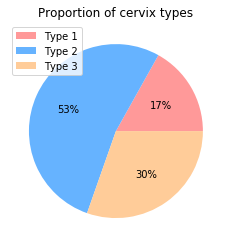

In [10]:
# We look at the distribution of the different types of cervix
length = [data_train_type_1.shape[0], data_train_type_2.shape[0], data_train_type_3.shape[0]]
type_name = ['Type 1', 'Type 2', 'Type 3']
plt.pie(length, labels=type_name, autopct='%1.0f%%', labeldistance=None, colors = ['#ff9999','#66b3ff','#ffcc99'])
plt.title("Proportion of cervix types")
plt.legend() 
plt.show()

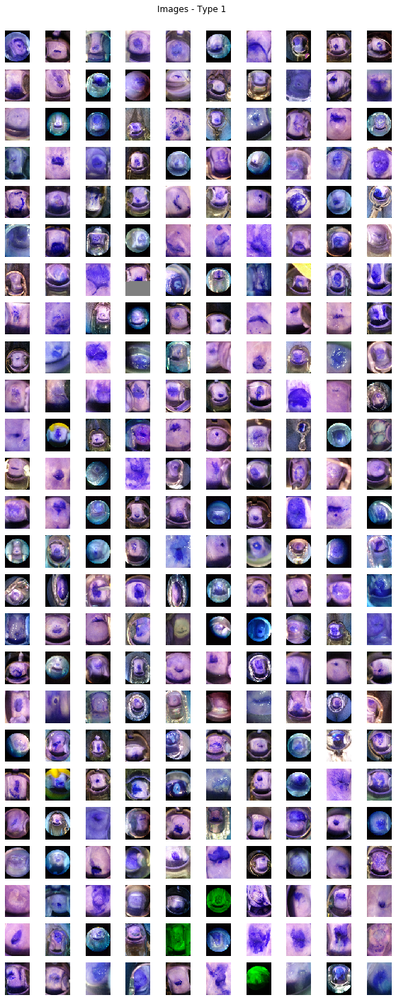

In [11]:
# Ploting the images of the type 1
plt.figure(figsize=(10,25))
for i in range(len(data_train_type_1)):
    plt.subplot(25,10,i+1)
    plt.imshow(data_train_type_1[i])
    plt.axis('off')
plt.suptitle("Images - Type 1", ha='center', va='top', y=0.9)
plt.show()

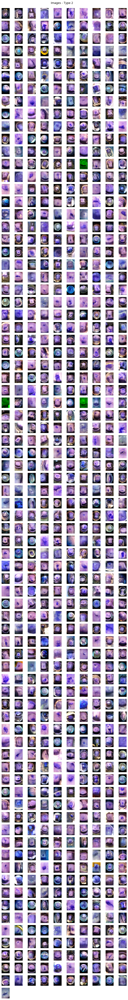

In [12]:
# Ploting the images of the type 2
plt.figure(figsize=(10,79))
for i in range(len(data_train_type_2)):
    plt.subplot(79,10,i+1)
    plt.imshow(data_train_type_2[i])
    plt.axis('off')
plt.suptitle("Images - Type 2", ha='center', va='top', y=0.885)
plt.show()

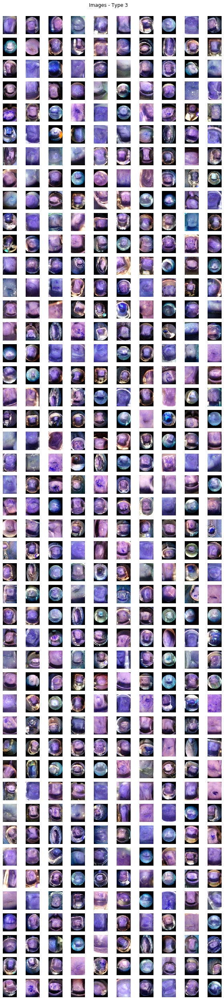

In [13]:
# Ploting the images of the type 3
plt.figure(figsize=(10,45))
for i in range(len(data_train_type_3)):
    plt.subplot(45,10,i+1)
    plt.imshow(data_train_type_3[i])
    plt.axis('off')
plt.suptitle("Images - Type 3", ha='center', va='top', y=0.89)
plt.show()

In [14]:
# Display two images
def display(img_a, img_b, title1="Original", title2="Edited"):
    plt.subplot(121)
    plt.imshow(img_a)
    plt.title(title1)
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(122)
    plt.imshow(img_b)
    plt.title(title2)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [11]:
# Create a function to remove the noise in the pictures
def remove_noise(img_array):
    '''
    Input: img_array, array grouping the arrays representing each image
    Output: array grouping the arrays representing each image without noise
    '''
    no_noise = []
    for i in range(len(img_array)):
        blur = cv2.GaussianBlur(img_array[i], (5, 5), 0)
        no_noise.append(blur)
    
    return np.array(no_noise)

In [12]:
# Create new arrays with the pictures without noise of the train set
data_train_type_1_no_noise = remove_noise(data_train_type_1)
data_train_type_2_no_noise = remove_noise(data_train_type_2)
data_train_type_3_no_noise = remove_noise(data_train_type_3)

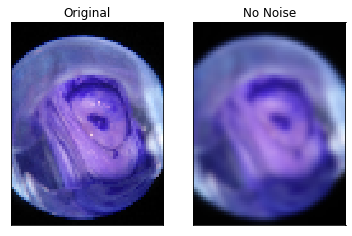

In [15]:
# Show the first image with and without noise
display(data_train_type_1[0], data_train_type_1_no_noise[0], 
        title1 = "Original", title2 = "No Noise")

In [16]:
# Create a function to segmente the images
def segmentation(img_array):
    '''
    Input: img_array, array grouping the arrays representing each image
    Output: array grouping the arrays representing each image without noise
    '''
    seg_img = []
    for i in range(len(img_array)):
        gray = cv2.cvtColor(img_array[i], cv2.COLOR_RGB2GRAY)
        ret, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_TRUNC)
        seg_img.append(thresh)
    
    return np.array(seg_img)

In [17]:
# Create new arrays with the pictures segmented of the train set
data_train_type_1_seg = segmentation(data_train_type_1_no_noise)
data_train_type_2_seg = segmentation(data_train_type_2_no_noise)
data_train_type_3_seg = segmentation(data_train_type_3_no_noise)

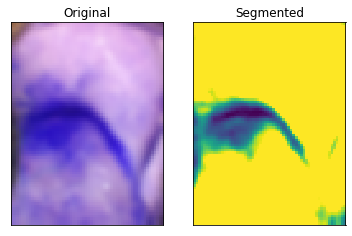

In [18]:
# Show an original image and the segmented one
display(data_train_type_1_no_noise[6], data_train_type_1_seg[6], 
        title1 = "Original", title2 = "Segmented")

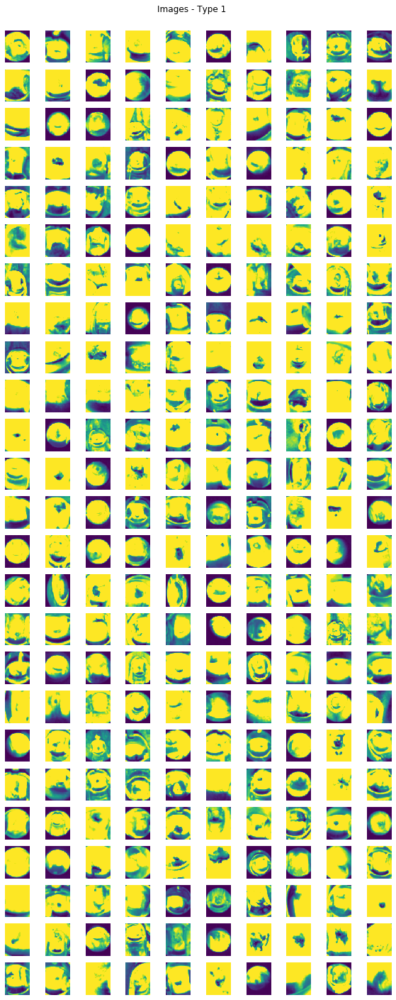

In [21]:
# Ploting the images of the type 1
plt.figure(figsize=(10,25))
for i in range(len(data_train_type_1_seg)):
    plt.subplot(25,10,i+1)
    plt.imshow(data_train_type_1_seg[i])
    #plt.title(train_type_1[i].split("/")[2])
    plt.axis('off')
plt.suptitle("Images - Type 1", ha='center', va='top', y=0.9)
plt.show()

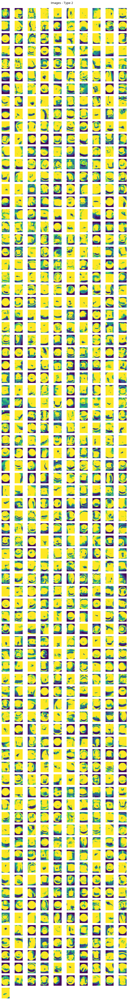

In [22]:
# Ploting the images of the type 2
plt.figure(figsize=(10,79))
for i in range(len(data_train_type_2_seg)):
    plt.subplot(79,10,i+1)
    plt.imshow(data_train_type_2_seg[i])
    plt.axis('off')
plt.suptitle("Images - Type 2", ha='center', va='top', y=0.885)
plt.show()

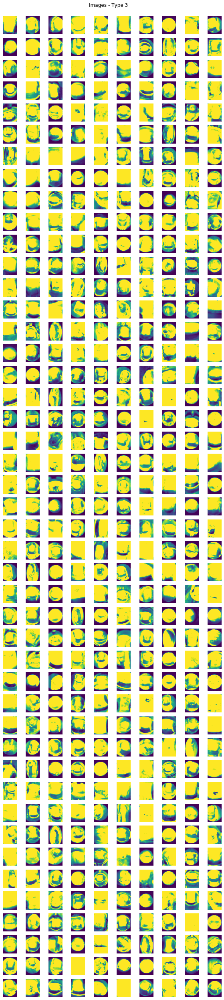

In [23]:
# Ploting the images of the type 3
plt.figure(figsize=(10,45))
for i in range(len(data_train_type_3_seg)):
    plt.subplot(45,10,i+1)
    plt.imshow(data_train_type_3_seg[i])
    plt.axis('off')
plt.suptitle("Images - Type 3", ha='center', va='top', y=0.89)
plt.show()

### Test Set

In [19]:
# Create new arrays with the pictures without noise of the test set
data_test_set_1_no_noise = remove_noise(data_test_set_1)
data_test_set_2_no_noise = remove_noise(data_test_set_2)

In [20]:
# Create new arrays with the pictures segmented of the test set
data_test_set_1_seg = segmentation(data_test_set_1_no_noise)
data_test_set_2_seg = segmentation(data_test_set_2_no_noise)

## Creation of the set used for the models

### Train and Validation Set

In [168]:
def create_train_val_set(data_train_type_1, data_train_type_2, data_train_type_3, type_data): 
    print("*** Creation of data set for the {} images: ***\n".format(type_data))
    # Pictures
    X = np.concatenate([data_train_type_1, data_train_type_2, 
                        data_train_type_3], axis=0)
    print("Shape of X: {}".format(X.shape))

    # Labels
    y = np.array([1] * len(data_train_type_1) + [2] * len(data_train_type_2) + [3] * len(data_train_type_3))
    print("Shape of y: {}\n".format(y.shape))

    # Reshape labels
    y = y.reshape(len(y), 1)

    # Split into train and validation set
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=0)
    print("Shape X_train: {} \nShape X_val: {} \n".format(X_train.shape, 
                                                                                             X_val.shape, 
                                                                                             y_train.shape, 
                                                                                             y_val.shape))

    # Change classes into categorical
    y_train = to_categorical(y_train, 4)
    y_val = to_categorical(y_val, 4)

    # Keep only the three type
    y_train = y_train[:,1:]
    y_val = y_val[:,1:]
    print("Shape y_train: {} \nShape y_val: {}".format(y_train.shape, 
                                                       y_val.shape))
    
    return X_train, X_val, y_train, y_val

In [22]:
X_train_original, X_val_original, y_train_original, y_val_original = create_train_val_set(data_train_type_1, 
                                                                                          data_train_type_2, 
                                                                                          data_train_type_3,
                                                                                         'original')

# Normalization
X_train_original = X_train_original / 255
X_val_original = X_val_original / 255

*** Creation of data set for the original images: ***

Shape of X: (1481, 80, 60, 3)
Shape of y: (1481,)

Shape X_train: (992, 80, 60, 3) 
Shape X_val: (489, 80, 60, 3) 

Shape y_train: (992, 3) 
Shape y_val: (489, 3)


In [23]:
X_train_no_noise, X_val_no_noise, y_train_no_noise, y_val_no_noise = create_train_val_set(data_train_type_1_no_noise, 
                                                                                          data_train_type_2_no_noise, 
                                                                                          data_train_type_3_no_noise,
                                                                                         'no noise')
# Normalization
X_train_no_noise = X_train_no_noise / 255
X_val_no_noise = X_val_no_noise / 255

*** Creation of data set for the no noise images: ***

Shape of X: (1481, 80, 60, 3)
Shape of y: (1481,)

Shape X_train: (992, 80, 60, 3) 
Shape X_val: (489, 80, 60, 3) 

Shape y_train: (992, 3) 
Shape y_val: (489, 3)


In [24]:
X_train_seg, X_val_seg, y_train_seg, y_val_seg = create_train_val_set(data_train_type_1_seg,
                                                                      data_train_type_2_seg,
                                                                      data_train_type_3_seg,
                                                                      'segmented')

# Normalization
X_train_seg = X_train_seg / 255
X_val_seg = X_val_seg / 255

*** Creation of data set for the segmented images: ***

Shape of X: (1481, 80, 60)
Shape of y: (1481,)

Shape X_train: (992, 80, 60) 
Shape X_val: (489, 80, 60) 

Shape y_train: (992, 3) 
Shape y_val: (489, 3)


### Test Set

In [25]:
def creation_test_set(data_test_set_1, data_test_set_2, data_type):
    print("*** Creation of test set for the {} images: ***".format(data_type))
    X_test = np.concatenate([data_test_set_1, data_test_set_2],
                            axis=0)
    print("Shape of X_test: {}\n".format(X_test.shape))
    return X_test

In [26]:
X_test_original = creation_test_set(data_test_set_1, 
                                    data_test_set_2, 
                                    "original")
X_test_no_noise = creation_test_set(data_test_set_1_no_noise, 
                                    data_test_set_2_no_noise, 
                                    "no_noise")
X_test_seg = creation_test_set(data_test_set_1_seg, 
                                    data_test_set_2_seg, 
                                    "segmented")

# Normalization
X_test_original = X_test_original / 255
X_test_no_noise = X_test_no_noise / 255
X_test_seg = X_test_seg / 255

*** Creation of test set for the original images: ***
Shape of X_test: (4018, 80, 60, 3)

*** Creation of test set for the no_noise images: ***
Shape of X_test: (4018, 80, 60, 3)

*** Creation of test set for the segmented images: ***
Shape of X_test: (4018, 80, 60)



In [27]:
img_test_path = []
for i in range(len(test_set_1)):
    split = test_set_1[i].split("/")
    img_test_path.append(split[3])
    
for i in range(len(test_set_2)):
    split = test_set_2[i].split("/")
    img_test_path.append(split[3])

## Machine Learning Approaches

### CNN
#### Model Creation for original data

In [236]:
# fix random seed for reproducibility
seed = 7
np.random.seed(seed)

In [237]:
# Create a function to create our model
def create_model(input_shape=(80, 60, 3), filters=32, acti_1='relu', 
                 acti_2='relu', optim='adam', strides_conv=2, padding='SAME',
                strides_pool=3, kernel=(5,5)):
    model = Sequential()

    ## First set of layers
    # Convolution layer
    model.add(Conv2D(filters=filters, kernel_size=kernel,
                    input_shape=input_shape, activation=acti_1,
                    strides=strides_conv, padding=padding))
    # Pooling layer
    model.add(MaxPool2D(pool_size=(2, 2), strides=strides_pool))
    model.add(Dropout(0.5))
    
    ## Second set of layers
    # Convolutional layers
    model.add(Conv2D(filters=filters, kernel_size=kernel,
             input_shape=input_shape, activation=acti_1,
                    strides=strides_conv, padding=padding))
    # Pooling layer
    model.add(MaxPool2D(pool_size=(2, 2), strides=strides_pool))
    model.add(Dropout(0.5))
    
    # Flatten images
    model.add(Flatten())

    # Dense Layer
    model.add(Dense(256, activation=acti_2))
    model.add(Dense(64, activation='relu'))
    
    ## Last layer in the classifier with 3 possible classes
    model.add(Dense(3, activation="softmax"))

    model.compile(loss='categorical_crossentropy',
                 optimizer=optim,
                 metrics=['accuracy'])
    
    return model

In [238]:
# We create an early stop to stop the training if the loss doesn't decrease anymore
early_stop = EarlyStopping(monitor='val_loss', patience=5)

In [239]:
model = create_model()

In [240]:
model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_116 (Conv2D)         (None, 40, 30, 32)        2432      
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 13, 10, 32)       0         
 g2D)                                                            
                                                                 
 dropout_22 (Dropout)        (None, 13, 10, 32)        0         
                                                                 
 conv2d_117 (Conv2D)         (None, 7, 5, 32)          25632     
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 2, 2, 32)         0         
 g2D)                                                            
                                                                 
 dropout_23 (Dropout)        (None, 2, 2, 32)        

#### Model training for original data

In [242]:
# Train the model
model.fit(X_train_original, y_train_original, 
          epochs=40,
          validation_data=(X_val_original, y_val_original),
          callbacks=[early_stop], verbose=1,
          batch_size=10)

Epoch 1/40
100/100 [==============================] - 2s 13ms/step - loss: 1.0306 - accuracy: 0.5161 - val_loss: 1.0055 - val_accuracy: 0.5501
Epoch 2/40
100/100 [==============================] - 1s 12ms/step - loss: 1.0144 - accuracy: 0.5161 - val_loss: 0.9773 - val_accuracy: 0.5501
Epoch 3/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0162 - accuracy: 0.5060 - val_loss: 0.9689 - val_accuracy: 0.5501
Epoch 4/40
100/100 [==============================] - 1s 12ms/step - loss: 0.9888 - accuracy: 0.5121 - val_loss: 0.9490 - val_accuracy: 0.5542
Epoch 5/40
100/100 [==============================] - 1s 13ms/step - loss: 0.9643 - accuracy: 0.5121 - val_loss: 0.9104 - val_accuracy: 0.5501
Epoch 6/40
100/100 [==============================] - 1s 14ms/step - loss: 0.9471 - accuracy: 0.5020 - val_loss: 0.8894 - val_accuracy: 0.5521
Epoch 7/40
100/100 [==============================] - 1s 12ms/step - loss: 0.9332 - accuracy: 0.5192 - val_loss: 0.8752 - val_accuracy: 0.5726

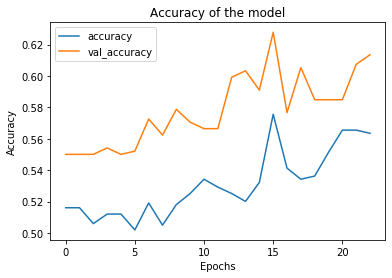

In [243]:
# Plot the Accuracy of the model throughout the epochs
losses = pd.DataFrame(model.history.history)
losses[["accuracy", 'val_accuracy']].plot()
plt.title("Accuracy of the model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

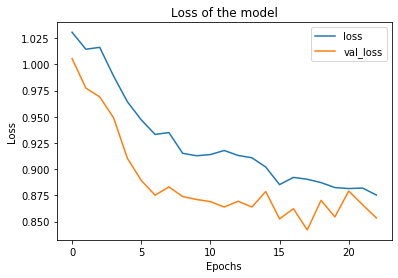

In [244]:
losses[['loss', "val_loss"]].plot()
plt.title("Loss of the model")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [245]:
# Create a function to predict the test set
def predict_test_set(model, X_test, img_path):
    '''
    Inputs: 
        model, model already trained on the train set
        X_test, data for which we want to have a prediction
        img_path, list of names' test set images
    
    Output:
        predictions, dataframe used to make submission on kaggle
    '''
    # Predict
    y_pred = model.predict(X_test)
    
    # Creation of a DataFrame with the predictions
    predictions = pd.DataFrame(y_pred)
    predictions.index = img_path
    predictions = predictions.reset_index()
    predictions.columns = ['image_name', 'Type_1', "Type_2", "Type_3"]
    
    return predictions

In [246]:
# Predict the test set
predictions_original = predict_test_set(model, X_test_original, img_test_path)

In [247]:
# View the predictions
predictions_original.head()

,image_name,Type_1,Type_2,Type_3
0,0.jpg,0.095135,0.584001,0.320863
1,1.jpg,0.060966,0.466274,0.472760
2,10.jpg,0.344593,0.538542,0.116864
3,100.jpg,0.120783,0.673697,0.205520
4,101.jpg,0.107482,0.670876,0.221642


In [248]:
# Save the predictions into a csv file
predictions_original.to_csv("predictions_orginal_ssid.csv", index=False)

**Results**
- Private Score: 0.92177 => 66th
- Public score: 0.88051

#### Model training for no noise data

In [249]:
# Creation of the model
model_no_noise = create_model()

In [250]:
# Train the model
model_no_noise.fit(X_train_no_noise, y_train_no_noise, 
                   epochs=40,
                   validation_data=(X_val_no_noise, y_val_no_noise),
                   callbacks=[early_stop], verbose=1, batch_size=10)

Epoch 1/40
100/100 [==============================] - 3s 19ms/step - loss: 1.0373 - accuracy: 0.4899 - val_loss: 0.9826 - val_accuracy: 0.5501
Epoch 2/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0261 - accuracy: 0.5111 - val_loss: 0.9973 - val_accuracy: 0.5501
Epoch 3/40
100/100 [==============================] - 1s 12ms/step - loss: 1.0234 - accuracy: 0.5161 - val_loss: 1.0014 - val_accuracy: 0.5501
Epoch 4/40
100/100 [==============================] - 1s 12ms/step - loss: 1.0195 - accuracy: 0.5161 - val_loss: 0.9763 - val_accuracy: 0.5501
Epoch 5/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0186 - accuracy: 0.5161 - val_loss: 0.9761 - val_accuracy: 0.5501
Epoch 6/40
100/100 [==============================] - 1s 14ms/step - loss: 1.0167 - accuracy: 0.5161 - val_loss: 0.9728 - val_accuracy: 0.5501
Epoch 7/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0069 - accuracy: 0.5161 - val_loss: 0.9762 - val_accuracy: 0.5501

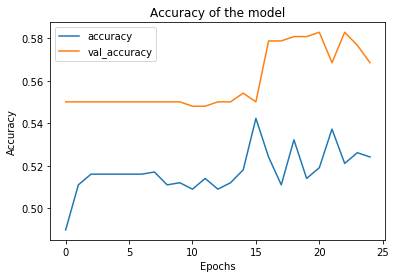

In [251]:
# Plot the Accuracy of the model throughout the epochs
losses = pd.DataFrame(model_no_noise.history.history)
losses[["accuracy", 'val_accuracy']].plot()
plt.title("Accuracy of the model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

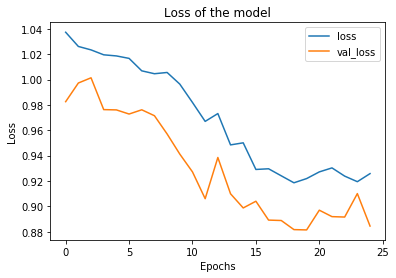

In [252]:
# Plot the losses of the model throughout the epochs
losses[['loss', "val_loss"]].plot()
plt.title("Loss of the model")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [253]:
# Predict the test set
predictions_no_noise = predict_test_set(model_no_noise, X_test_no_noise, img_test_path)

In [254]:
# View the predictions
predictions_no_noise.head()

,image_name,Type_1,Type_2,Type_3
0,0.jpg,0.244631,0.577430,0.177939
1,1.jpg,0.089274,0.474412,0.436314
2,10.jpg,0.361170,0.550743,0.088087
3,100.jpg,0.167403,0.563960,0.268637
4,101.jpg,0.162196,0.520404,0.317400


In [255]:
# Save the predictions into a csv file
predictions_no_noise.to_csv("predictions_no_noise_ssid.csv", index=False)

**Results**
- Private score: 0.93721 => 81th
- Public score: 0.89393

#### Tuning Hyper-parameters

In [256]:
# Creation of the dictionary for the tuning of the hyperparameters
activation_1 = ['relu', "sigmoid", "tanh"]
activation_2 = ['relu', "sigmoid", "tanh"]
optimizer = ['SGD', "adam", "RMSprop", "adagrad"]
kernel_size=[(3, 3), (5, 5), (7, 7)]
strides_pool = [1, 2, 3]
strides_conv = [1, 2, 3]
padding= ['SAME', 'VALID']

param_grid = {"acti_1":activation_1, "optim":optimizer, 
              "kernel":kernel_size, 'acti_2':activation_2,
             "strides_pool":strides_pool, "strides_conv":strides_conv,
             "padding":padding}

In [257]:
# Creation of the randomized search
model_tuning = KerasClassifier(build_fn=create_model, epochs=5, batch_size=10)
search = RandomizedSearchCV(estimator=model_tuning, param_distributions=param_grid)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  


In [258]:
search_result = search.fit(X_train_original, y_train_original,
                           validation_data=(X_val_original, y_val_original))

Epoch 1/5
80/80 [==============================] - 4s 33ms/step - loss: 1.0386 - accuracy: 0.5170 - val_loss: 0.9894 - val_accuracy: 0.5501
Epoch 2/5
80/80 [==============================] - 1s 16ms/step - loss: 1.0235 - accuracy: 0.5158 - val_loss: 0.9981 - val_accuracy: 0.5501
Epoch 3/5
80/80 [==============================] - 1s 18ms/step - loss: 1.0326 - accuracy: 0.5233 - val_loss: 1.0062 - val_accuracy: 0.5501
Epoch 4/5
80/80 [==============================] - 1s 17ms/step - loss: 1.0177 - accuracy: 0.5233 - val_loss: 0.9886 - val_accuracy: 0.5501
Epoch 5/5
20/20 [==============================] - 0s 6ms/step - loss: 1.0142 - accuracy: 0.4874
Epoch 1/5
80/80 [==============================] - 2s 19ms/step - loss: 1.0576 - accuracy: 0.4931 - val_loss: 1.0452 - val_accuracy: 0.5501
Epoch 2/5
80/80 [==============================] - 1s 16ms/step - loss: 1.0272 - accuracy: 0.5032 - val_loss: 1.0156 - val_accuracy: 0.5501
Epoch 3/5
80/80 [==============================] - 1s 17ms/step

In [259]:
# Summarize results
print("Best: %f using %s" % (search_result.best_score_, search_result.best_params_))
means = search_result.cv_results_['mean_test_score']
stds = search_result.cv_results_['std_test_score']
params = search_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.517162 using {'strides_pool': 1, 'strides_conv': 3, 'padding': 'VALID', 'optim': 'adam', 'kernel': (5, 5), 'acti_2': 'tanh', 'acti_1': 'relu'}
0.516151 (0.016459) with: {'strides_pool': 2, 'strides_conv': 2, 'padding': 'VALID', 'optim': 'adam', 'kernel': (7, 7), 'acti_2': 'relu', 'acti_1': 'relu'}
0.516151 (0.016459) with: {'strides_pool': 3, 'strides_conv': 2, 'padding': 'VALID', 'optim': 'adagrad', 'kernel': (5, 5), 'acti_2': 'tanh', 'acti_1': 'sigmoid'}
0.517162 (0.015236) with: {'strides_pool': 1, 'strides_conv': 3, 'padding': 'VALID', 'optim': 'adam', 'kernel': (5, 5), 'acti_2': 'tanh', 'acti_1': 'relu'}
0.516151 (0.016459) with: {'strides_pool': 2, 'strides_conv': 3, 'padding': 'VALID', 'optim': 'adagrad', 'kernel': (3, 3), 'acti_2': 'tanh', 'acti_1': 'relu'}
0.509096 (0.016917) with: {'strides_pool': 2, 'strides_conv': 1, 'padding': 'SAME', 'optim': 'adam', 'kernel': (5, 5), 'acti_2': 'sigmoid', 'acti_1': 'tanh'}
0.516151 (0.016459) with: {'strides_pool': 2, 'strides_con

In [264]:
model_tuning = create_model(strides_pool=1, strides_conv=3, 
                            padding='VALID', optim='adam', 
                            kernel=(5, 5), acti_2='tanh', acti_1='relu')

In [265]:
# Train the model
model_tuning.fit(X_train_original, y_train_original, 
                   epochs=40,
                   validation_data=(X_val_original, y_val_original),
                   callbacks=[early_stop], verbose=1, batch_size=10)

Epoch 1/40
100/100 [==============================] - 2s 18ms/step - loss: 1.0380 - accuracy: 0.5081 - val_loss: 1.0217 - val_accuracy: 0.5501
Epoch 2/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0208 - accuracy: 0.5181 - val_loss: 1.0214 - val_accuracy: 0.5501
Epoch 3/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0193 - accuracy: 0.5141 - val_loss: 0.9913 - val_accuracy: 0.5501
Epoch 4/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0197 - accuracy: 0.5171 - val_loss: 0.9972 - val_accuracy: 0.5501
Epoch 5/40
100/100 [==============================] - 1s 13ms/step - loss: 1.0117 - accuracy: 0.5091 - val_loss: 0.9625 - val_accuracy: 0.5501
Epoch 6/40
100/100 [==============================] - 1s 12ms/step - loss: 0.9748 - accuracy: 0.5020 - val_loss: 0.9339 - val_accuracy: 0.5419
Epoch 7/40
100/100 [==============================] - 1s 12ms/step - loss: 0.9642 - accuracy: 0.5151 - val_loss: 0.9491 - val_accuracy: 0.5460

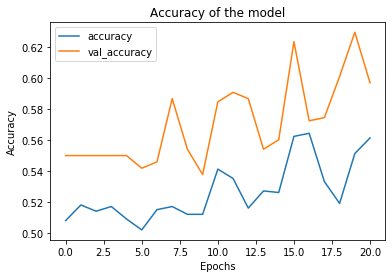

In [266]:
# Plot the Accuracy of the model throughout the epochs
losses = pd.DataFrame(model_tuning.history.history)
losses[["accuracy", 'val_accuracy']].plot()
plt.title("Accuracy of the model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

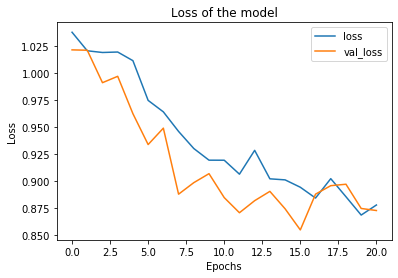

In [267]:
# Plot the losses of the model throughout the epochs
losses[['loss', "val_loss"]].plot()
plt.title("Loss of the model")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [268]:
# Predict the test set
predictions_tuning = predict_test_set(model_tuning, X_test_original, img_test_path)

In [269]:
# Save the predictions into a csv file
predictions_tuning.to_csv("predictions_cnn_tuned_ssid.csv", index=False)

**Results**
- Private score: 0.92782 => 69th
- Public score: 0.88510

### Data Augmentation

In [270]:
# Create data generator
datagen = ImageDataGenerator()

In [271]:
# Create iterator
iterator = datagen.flow(X_train_original, y_train_original)

In [272]:
# We create an early stop to stop the training if the loss doesn't decrease anymore
early_stop = EarlyStopping(monitor='val_loss', patience=3)

In [80]:
model_data_aug = create_model(strides_pool=3, strides_conv=2, 
                            padding='VALID', optim='RMSprop', 
                            kernel=(5, 5), acti_2='tanh', acti_1='relu')

In [277]:
model_data_aug = create_model(strides_pool=1, strides_conv=3, 
                            padding='VALID', optim='adam', 
                            kernel=(5, 5), acti_2='tanh', acti_1='relu')

In [278]:
model_data_aug.fit(iterator, 
                             epochs=40,
                             validation_data=(X_val_original, y_val_original),
                             callbacks=[early_stop], verbose=1, batch_size=10)

Epoch 1/40
31/31 [==============================] - 2s 54ms/step - loss: 1.0363 - accuracy: 0.4929 - val_loss: 1.0544 - val_accuracy: 0.5501
Epoch 2/40
31/31 [==============================] - 1s 44ms/step - loss: 1.0190 - accuracy: 0.5181 - val_loss: 0.9993 - val_accuracy: 0.5501
Epoch 3/40
31/31 [==============================] - 1s 40ms/step - loss: 1.0163 - accuracy: 0.5161 - val_loss: 0.9883 - val_accuracy: 0.5501
Epoch 4/40
31/31 [==============================] - 1s 37ms/step - loss: 1.0199 - accuracy: 0.5171 - val_loss: 0.9924 - val_accuracy: 0.5501
Epoch 5/40
31/31 [==============================] - 1s 36ms/step - loss: 0.9996 - accuracy: 0.5181 - val_loss: 0.9545 - val_accuracy: 0.5481
Epoch 6/40
31/31 [==============================] - 1s 47ms/step - loss: 0.9976 - accuracy: 0.5171 - val_loss: 0.9650 - val_accuracy: 0.5174
Epoch 7/40
31/31 [==============================] - 1s 38ms/step - loss: 0.9596 - accuracy: 0.5212 - val_loss: 0.9188 - val_accuracy: 0.5562
Epoch 8/40
31

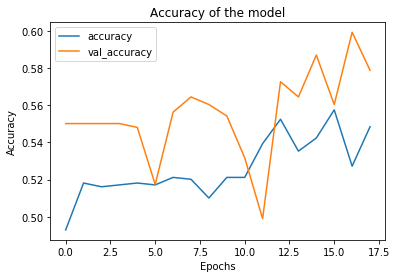

In [279]:
# Plot the Accuracy of the model throughout the epochs
losses = pd.DataFrame(model_data_aug.history.history)
losses[["accuracy", 'val_accuracy']].plot()
plt.title("Accuracy of the model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

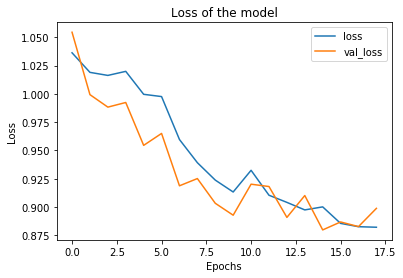

In [280]:
# Plot the losses of the model throughout the epochs
losses[['loss', "val_loss"]].plot()
plt.title("Loss of the model")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [281]:
# Predict the test set
predictions_data_aug = predict_test_set(model_data_aug, X_test_original, img_test_path)

In [282]:
# Save the predictions into a csv file
predictions_data_aug.to_csv("predictions_data_aug_ssid.csv", index=False)

**Results**
- Private score: 0.93328 => 77th
- Public score: 0.90842

### Transfer Learning

In [283]:
# Change the dimension of the pictures into 299 by 299 to apply transfer learning
X_train = X_train_original * 255
X_train = X_train.astype(np.uint8)

X_val = X_val_original * 255
X_val = X_val.astype(np.uint8)

X_test = X_test_original * 255
X_test = X_test.astype(np.uint8)

X_train = np.array([np.array(Image.fromarray(x).resize(size=(299, 299))) for x in X_train])
X_val = np.array([np.array(Image.fromarray(x).resize(size=(299, 299))) for x in X_val])
X_test = np.array([np.array(Image.fromarray(x).resize(size=(299, 299))) for x in X_test])

X_train = X_train / 255
X_val = X_val / 255
X_test = X_test / 255

In [284]:
# Construct the base of our model
base_model = InceptionV3(weights='imagenet', 
                         include_top=False,
                         input_shape=(299, 299, 3),
                         classes=3,
                         classifier_activation="softmax")

In [285]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_234 (Conv2D)            (None, 149, 149, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_98 (BatchN  (None, 149, 149, 32  96         ['conv2d_234[0][0]']             
 ormalization)                  )                                                      

In [286]:
# Extract the last layer 
last = base_model.get_layer('mixed0').output

In [288]:
# Add classification layers on top of it
x = GlobalAveragePooling2D()(last)
x = BatchNormalization()(x)
x = Dense(256, activation='relu')(x)
x = Dense(64, activation='relu')(x)
pred = Dense(3, activation='softmax')(x)
model_transfer = Model(base_model.input, pred)

In [289]:
model_transfer.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_234 (Conv2D)            (None, 149, 149, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_98 (BatchN  (None, 149, 149, 32  96         ['conv2d_234[0][0]']             
 ormalization)                  )                                                           

In [290]:
# Since our objective is to only train the custom classifier, we freeze the layers of Inception V3
for layer in base_model.layers:
     layer.trainable = False

In [291]:
# We compile the model
model_transfer.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=1e-4),
              metrics=['accuracy'])

In [292]:
# We create an early stop to stop the training if the loss doesn't decrease anymore
early_stop = EarlyStopping(monitor='val_loss', patience=3)

In [294]:
history = model_transfer.fit(X_train, y_train_original,
                    validation_data=[X_val, y_val_original],
                    epochs=20, callbacks=[early_stop])

Epoch 1/20
31/31 [==============================] - 75s 2s/step - loss: 0.8576 - accuracy: 0.6008 - val_loss: 0.9946 - val_accuracy: 0.5317
Epoch 2/20
31/31 [==============================] - 69s 2s/step - loss: 0.8408 - accuracy: 0.6058 - val_loss: 0.9913 - val_accuracy: 0.5215
Epoch 3/20
31/31 [==============================] - 78s 3s/step - loss: 0.8311 - accuracy: 0.6300 - val_loss: 0.9873 - val_accuracy: 0.5276
Epoch 4/20
31/31 [==============================] - 61s 2s/step - loss: 0.8131 - accuracy: 0.6361 - val_loss: 0.9812 - val_accuracy: 0.5235
Epoch 5/20
31/31 [==============================] - 62s 2s/step - loss: 0.7974 - accuracy: 0.6643 - val_loss: 0.9762 - val_accuracy: 0.5419
Epoch 6/20
31/31 [==============================] - 54s 2s/step - loss: 0.7864 - accuracy: 0.6573 - val_loss: 0.9679 - val_accuracy: 0.5358
Epoch 7/20
31/31 [==============================] - 70s 2s/step - loss: 0.7745 - accuracy: 0.6593 - val_loss: 0.9610 - val_accuracy: 0.5419
Epoch 8/20
31/31 [==

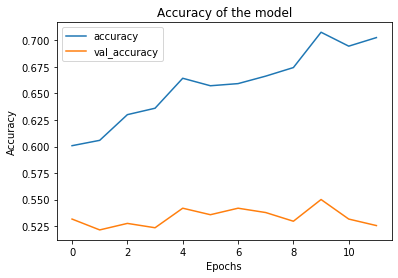

In [295]:
# Plot the Accuracy of the model throughout the epochs
losses = pd.DataFrame(model_transfer.history.history)
losses[["accuracy", 'val_accuracy']].plot()
plt.title("Accuracy of the model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

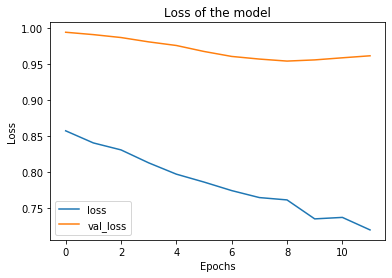

In [296]:
losses[['loss', "val_loss"]].plot()
plt.title("Loss of the model")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [297]:
# Predict the test set
predictions_transfer = predict_test_set(model_transfer, X_test, img_test_path)

In [298]:
# Save the predictions into a csv file
predictions_transfer.to_csv("predictions_transfer_ssid.csv", index=False)

**Results**
- Private score: 1.00035 => 170th
- Public score: 0.93299

## Results

In [299]:
# We change the y_val with one column array with the number of the type 1, 2 or 3
y_val = [np.argmax(y_val_original[i])+1 for i in range(len(y_val_original))]

In [300]:
def printed_confusion_matrix(model, X_val, y_val, model_name):
    '''
    Function to plot the confusion matrix of the model scored on the validation set
    Inputs:
        model, pre-trained on the data
        X_val, array of the value of the validation set
        y_val, one column array with the value of the type
        model_name, str corresponding to the name of the model
    Output:
        y_pred, array with the prediction of the model for the X_val
    '''
    y_pred = model.predict(X_val)
    y_pred = [np.argmax(y_pred[i])+1 for i in range(len(y_pred))]
    
    cm = confusion_matrix(y_val, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_pourcentage = ["{0:.2%}".format(value) for value in cm_normalized.flatten()]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_pourcentage)]
    labels = np.asarray(labels).reshape(3, 3)

    sns.heatmap(cm_normalized, annot=labels, fmt='', cmap=plt.cm.Blues, annot_kws={'fontsize':15}, vmin=0, vmax=1, square=True)
    plt.xticks([0.5, 1.5, 2.5], ["1", "2", "3"], fontsize=15)
    plt.yticks([0.5, 1.5, 2.5], ["1", "2", "3"],fontsize=15, rotation=0)

    plt.title("Confusion Matrix for " + model_name, fontsize=20)
    return y_pred

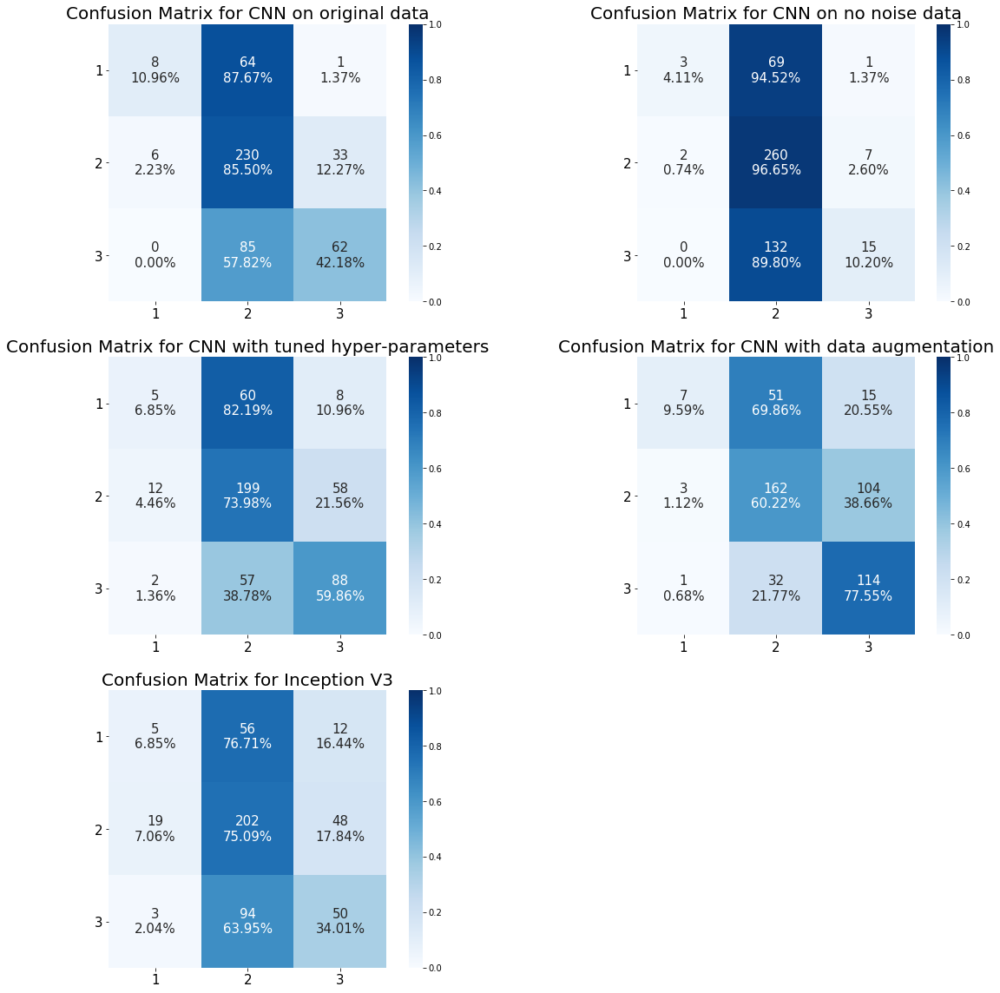

In [302]:
# We print the confusion matrix of our models
models = [model, model_no_noise, model_tuning, model_data_aug, model_transfer]
models_name = ['CNN on original data', "CNN on no noise data", "CNN with tuned hyper-parameters", 
               "CNN with data augmentation", "Inception V3"]
X_to_predict = [X_val_original, X_val_no_noise, X_val_original, X_val_original, X_val]

for i in range(len(models)):
    plt.figure(1, figsize=(20, 20))
    plt.subplot(3, 2, i + 1)
    y_pred = printed_confusion_matrix(models[i], X_to_predict[i], y_val, models_name[i])